In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader, Sampler
from AdaIN import AdaIN

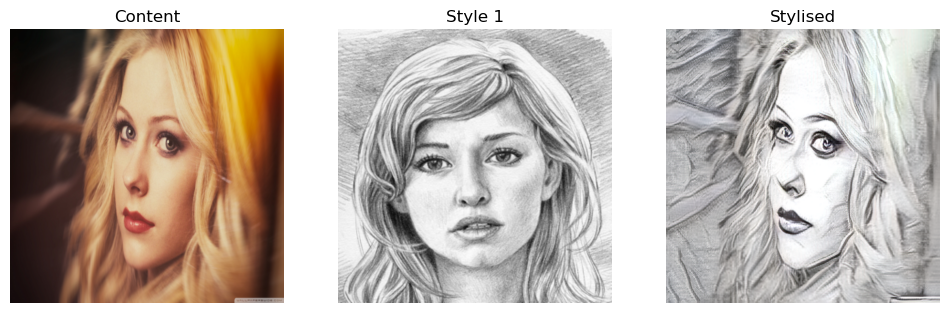

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.708, 850.7652499974938)

In [2]:
style_path = "style/sketch.png"
prebuildEncoder = "Model/vgg.pth"
image_path = "content/avril.jpg"
prebuildDecoder = "Model/decoder-adain.pth"

#Provided decoder run
adainModel = AdaIN(prebuildEncoder, prebuildDecoder)
adainModel.setup()
adainModel.fit(image_path, [style_path])
adainModel.pipeline()
adainModel.displayImages()
adainModel.evaluate()

## Hyperparameter Tuning
### Default test at 4_1 relu

In [4]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(256),
    transforms.ToTensor()
])

#coco content
train_content_dataset = datasets.ImageFolder(
    root= "../coco",             
    transform=transform
)

#wikiart
train_style_dataset = datasets.ImageFolder(
    root= "../archive",             
    transform=transform
)

train_content_loader = DataLoader(train_content_dataset, batch_size=1, shuffle=True)
train_style_loader = DataLoader(train_style_dataset, batch_size=1, shuffle=True)

#training completed
# defaultModel = AdaIN(prebuildEncoder)
# defaultModel.loadPrebuildEncoder(31)
# defaultModel.epochTraining(train_content_loader, train_style_loader, "default", steps = 20000, epoch = 5)
# defaultModel.fit(image_path,[style_path])
# defaultModel.pipeline()
# defaultModel.displayImages()
# defaultModel.evaluate()

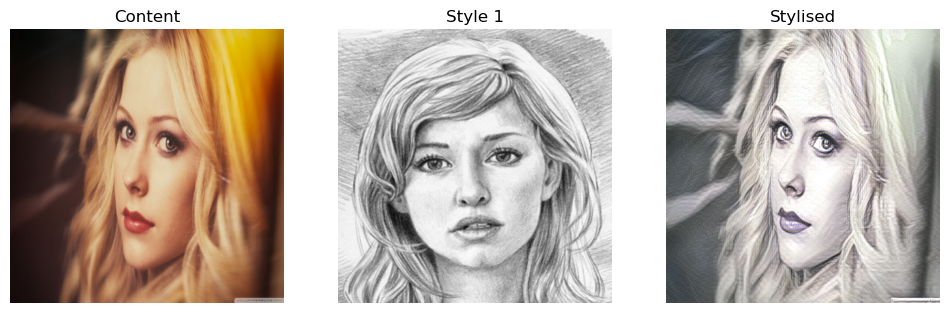

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


(0.583, 129.69624999095686)

In [5]:
defaultModel = AdaIN(prebuildEncoder, "./default_5.pth")
defaultModel.setup(31)
defaultModel.fit(image_path,[style_path])
defaultModel.pipeline()
defaultModel.displayImages()
defaultModel.evaluate()

### Content and Style weight proportion at 4_1 relu

In [7]:
#Parameter to Train
style_w= [5.0, 10.0, 30.0]
content_w= [1.0, 5.0, 10.0]


# Training Complete
# for cw in content_w:
#     for sw in style_w:
#         print(f"Training at content: {cw} and style: {sw}")
#         model = AdaIN(prebuildEncoder)
#         model.loadPrebuildEncoder(31)
#         model.epochTraining(train_content_loader, train_style_loader, f"default_{int(cw)}_{int(sw)}", steps = 20000, epoch = 5, style_weight = sw, content_weight=cw)
#         model.fit(image_path,[style_path])
#         model.pipeline()
#         model.displayImages()

Model at content: 1.0 and style: 5.0


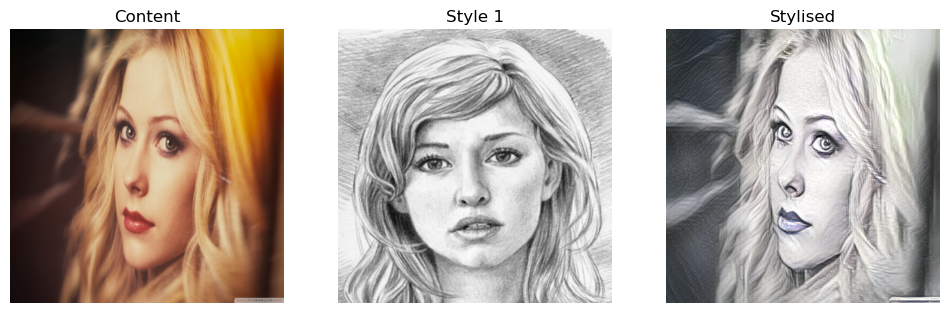

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.625, 221.98112499609124)
Model at content: 1.0 and style: 10.0


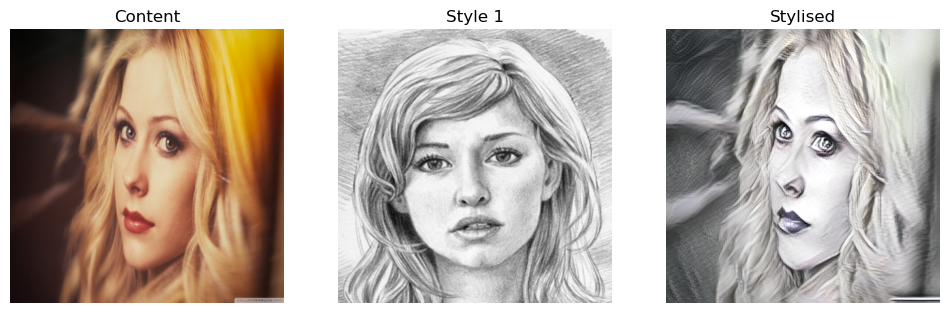

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.655, 128.22175001201686)
Model at content: 1.0 and style: 30.0


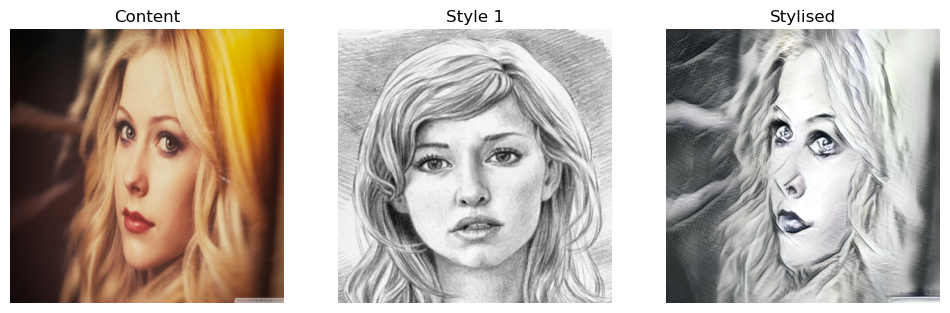

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.709, 132.93924999015871)
Model at content: 5.0 and style: 5.0


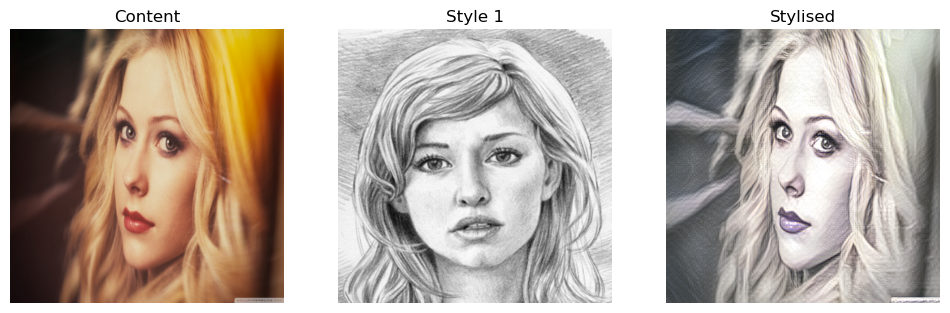

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.579, 127.09245800215285)
Model at content: 5.0 and style: 10.0


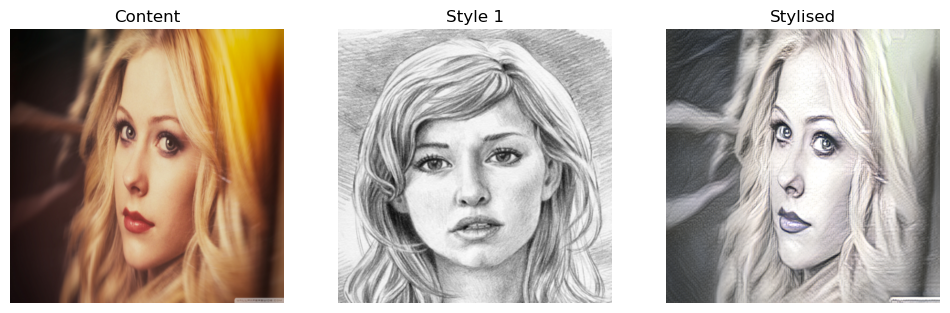

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.588, 132.2258750005858)
Model at content: 5.0 and style: 30.0


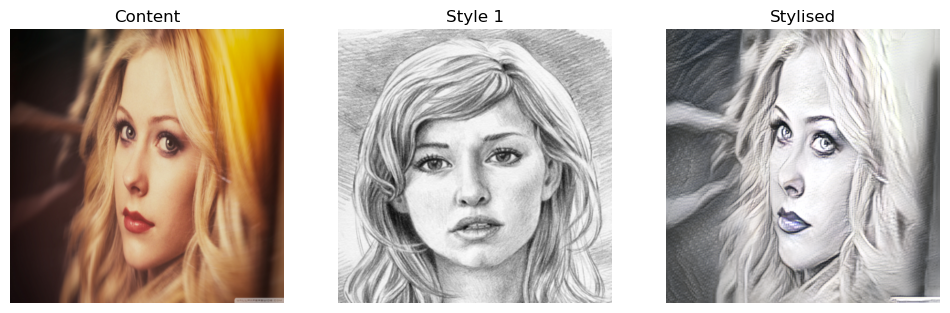

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.661, 129.97379100124817)
Model at content: 10.0 and style: 5.0


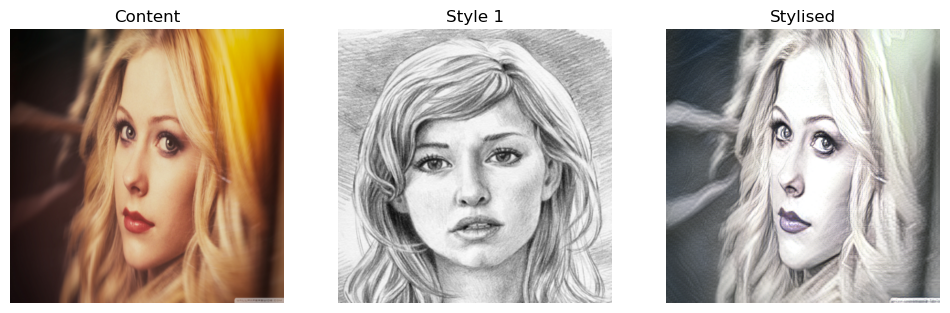

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.556, 122.37629100854974)
Model at content: 10.0 and style: 10.0


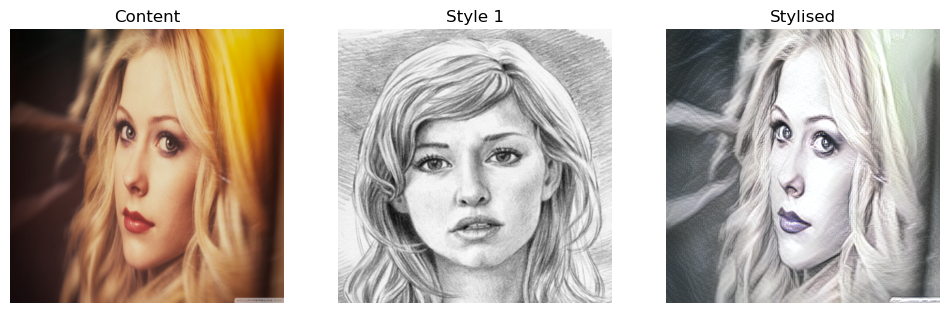

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.59, 122.61687499994878)
Model at content: 10.0 and style: 30.0


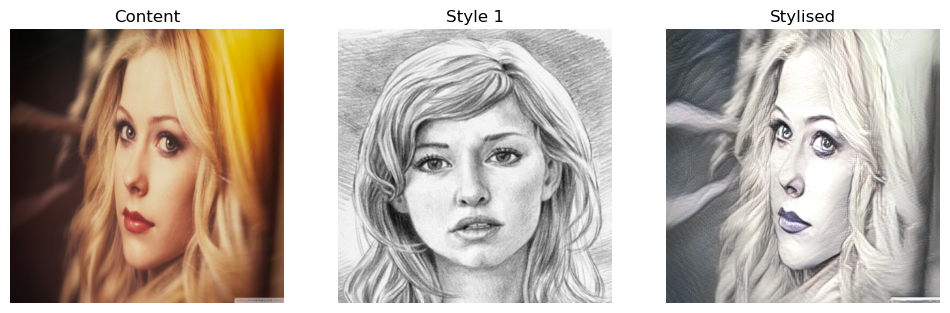

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.609, 132.04070899519138)


In [8]:
for cw in content_w:
    for sw in style_w:
        print(f"Model at content: {cw} and style: {sw}")
        model = AdaIN(prebuildEncoder, f"default_{int(cw)}_{int(sw)}_5.pth")
        model.setup(31)
        model.fit(image_path,[style_path])
        model.pipeline()
        model.displayImages()
        print(model.evaluate())

## Default Test at 4_2 relu

In [10]:
def vgg19_4_2Decoder():
    return nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(512, 512, 3),
            nn.ReLU(inplace=True),
        
            nn.ReflectionPad2d(1),
            nn.Conv2d(512, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 64, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 64, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 3, 3),
        )
#Training Complete
# vgg4_2Model = AdaIN(prebuildEncoder)
# vgg4_2Model.loadPrebuildEncoder(34)
# vgg4_2Model.uploadDecoder(vgg19_4_2Decoder())
# vgg4_2Model.epochTraining(train_content_loader, train_style_loader, "vgg19_4_2_default", steps = 20000, epoch = 5)
# vgg4_2Model.fit(image_path,[style_path])
# vgg4_2Model.pipeline()
# vgg4_2Model.displayImages()
# vgg4_2Model.evaluate()

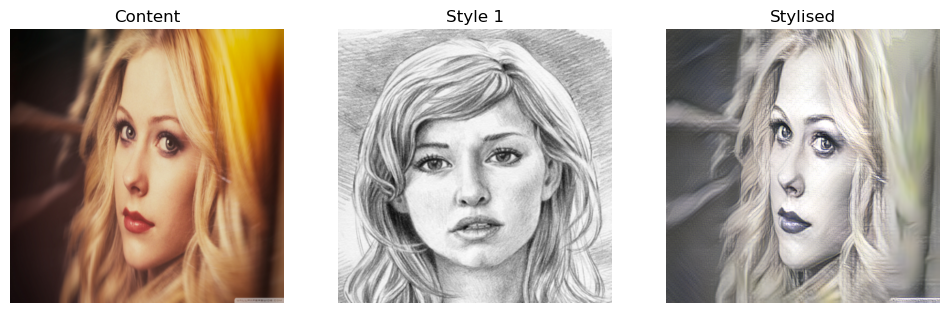

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.573, 145.53566700487863)

In [11]:
vgg4_2Model = AdaIN(prebuildEncoder, "./vgg19_4_2_default_5.pth")
vgg4_2Model.uploadDecoder(vgg19_4_2Decoder())
vgg4_2Model.setup(34)
vgg4_2Model.fit(image_path,[style_path])
vgg4_2Model.pipeline()
vgg4_2Model.displayImages()
vgg4_2Model.evaluate()

In [12]:
#Training Complete
# for cw in content_w:
#     for sw in style_w:
#         print(f"Training at content: {cw} and style: {sw}")
#         model = AdaIN(prebuildEncoder)
#         model.loadPrebuildEncoder(34)
#         model.uploadDecoder(vgg19_4_2Decoder())
#         model.epochTraining(train_content_loader, train_style_loader, f"vgg19_4_2_{int(cw)}_{int(sw)}", steps = 20000, epoch = 5, style_weight = sw, content_weight=cw)
#         model.fit(image_path,[style_path])
#         model.pipeline()
#         model.displayImages()

Model at content: 1.0 and style: 5.0


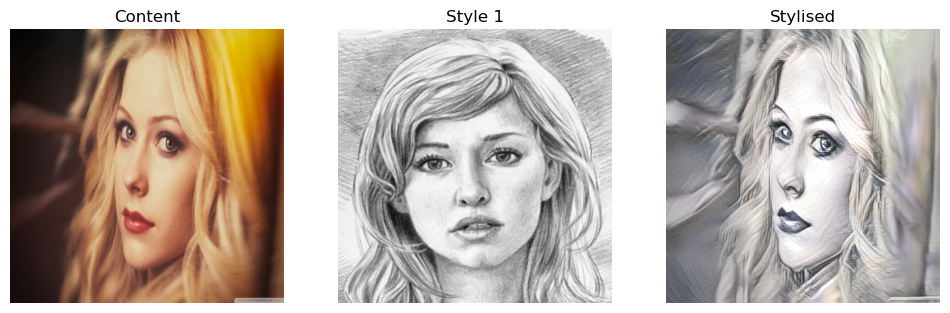

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.635, 146.0083330021007)
Model at content: 1.0 and style: 10.0


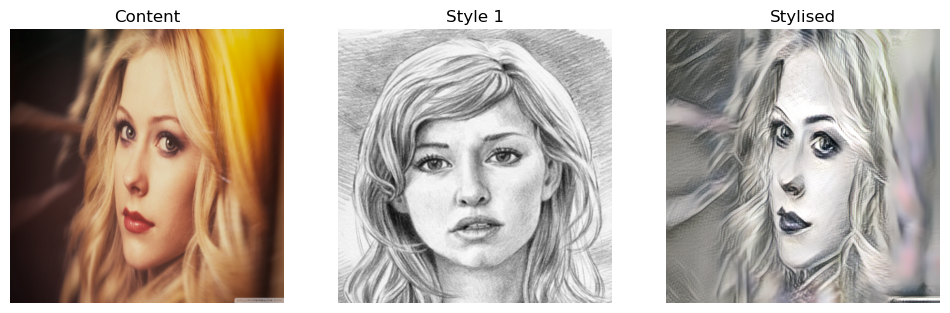

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.658, 144.7770000086166)
Model at content: 1.0 and style: 30.0


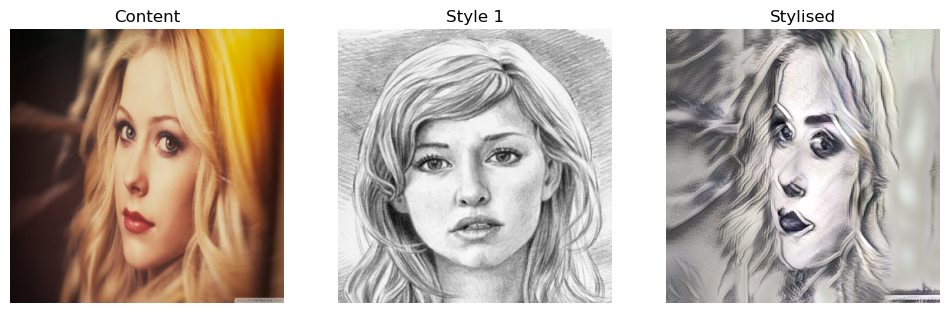

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.753, 150.9972909989301)
Model at content: 5.0 and style: 5.0


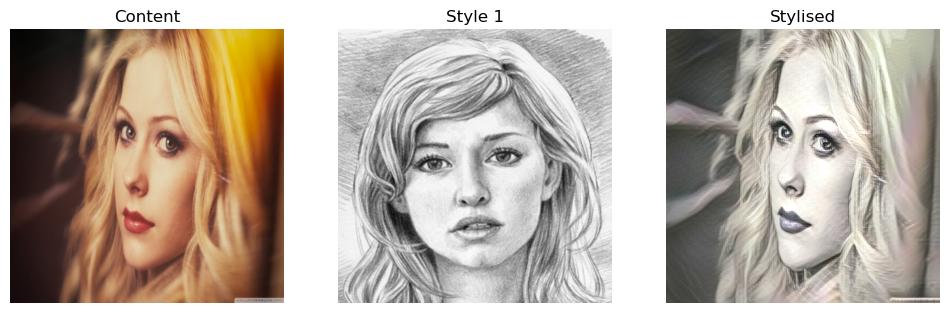

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.532, 145.4563750012312)
Model at content: 5.0 and style: 10.0


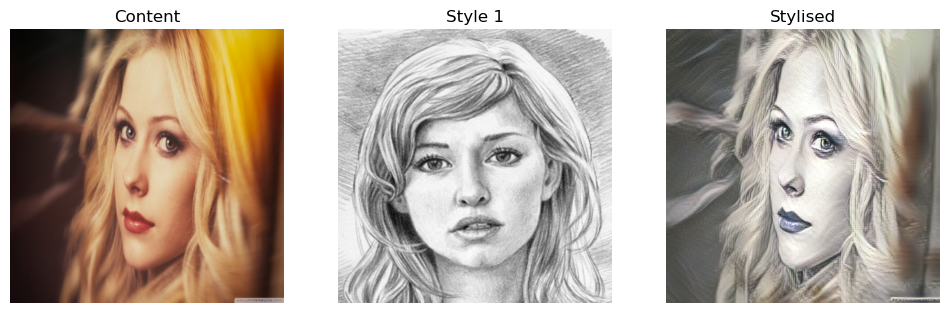

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.59, 146.33470799890347)
Model at content: 5.0 and style: 30.0


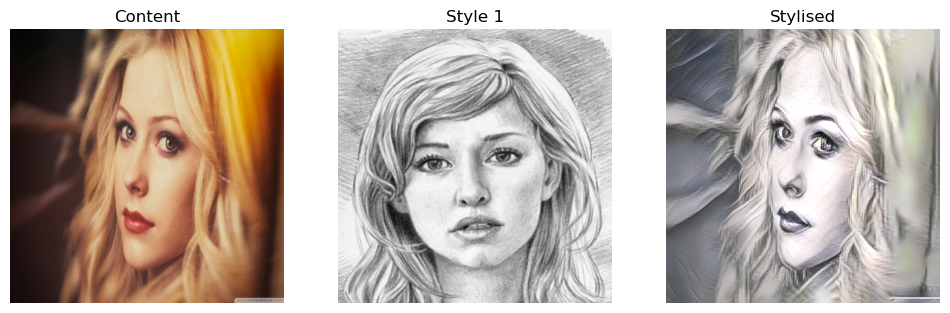

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.664, 147.4487079976825)
Model at content: 10.0 and style: 5.0


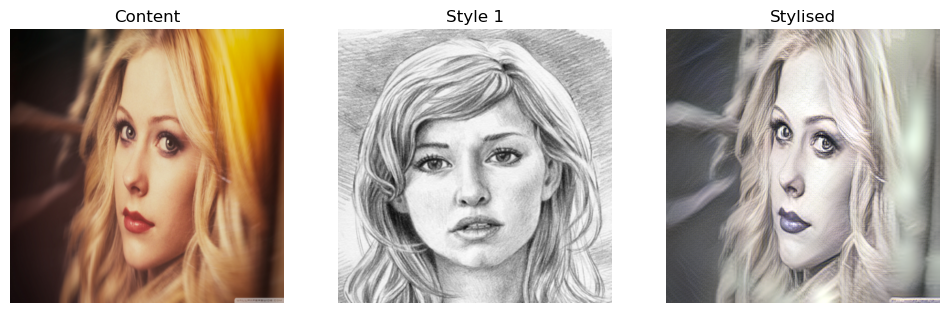

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.542, 144.4599999958882)
Model at content: 10.0 and style: 10.0


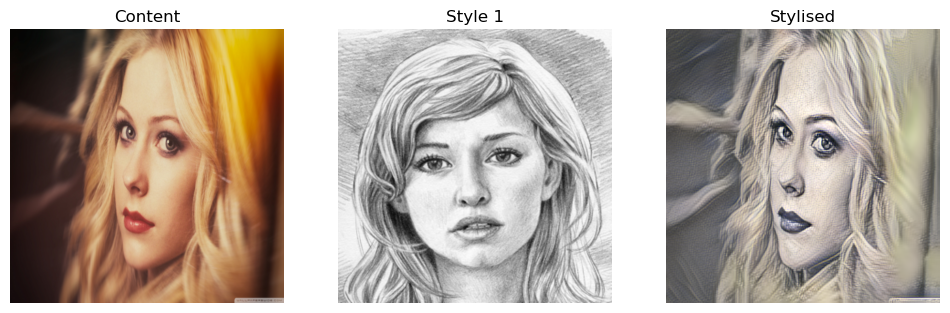

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.647, 152.82616698823404)
Model at content: 10.0 and style: 30.0


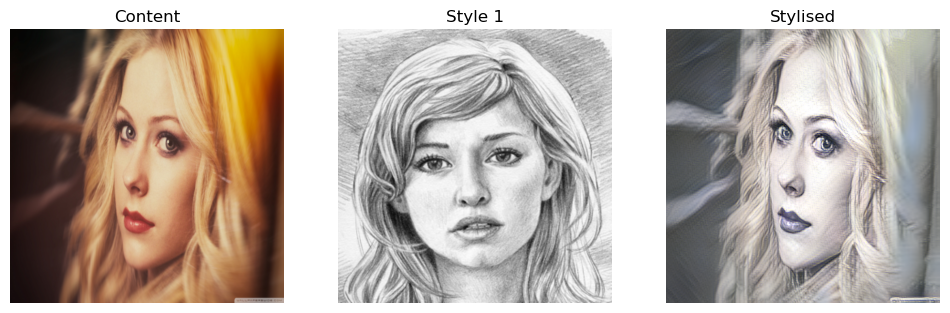

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.581, 152.13362500071526)


In [13]:
for cw in content_w:
    for sw in style_w:
        print(f"Model at content: {cw} and style: {sw}")
        model = AdaIN(prebuildEncoder, f"vgg19_4_2_{int(cw)}_{int(sw)}_5.pth")
        model.loadPrebuildEncoder(34)
        model.uploadDecoder(vgg19_4_2Decoder())
        model.loadPrebuildDecoder()
        model.fit(image_path,[style_path])
        model.pipeline()
        model.displayImages()
        print(model.evaluate())

In [14]:
def vgg19_3_3Decoder():
    return nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 128, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(128, 64, 3),
            nn.ReLU(inplace=True),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 64, 3),
            nn.ReLU(inplace=True),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(64, 3, 3),
        )
#Training Complete
# vgg3_3Model = AdaIN(prebuildEncoder)
# vgg3_3Model.loadPrebuildEncoder(27)
# vgg3_3Model.uploadDecoder(vgg19_3_3Decoder())
# vgg3_3Model.epochTraining(train_content_loader, train_style_loader, "vgg19_3_3_default", steps = 20000, epoch = 5)
# vgg3_3Model.fit(image_path,[style_path])
# vgg3_3Model.pipeline()
# vgg3_3Model.displayImages()
# vgg3_3Model.evaluate()

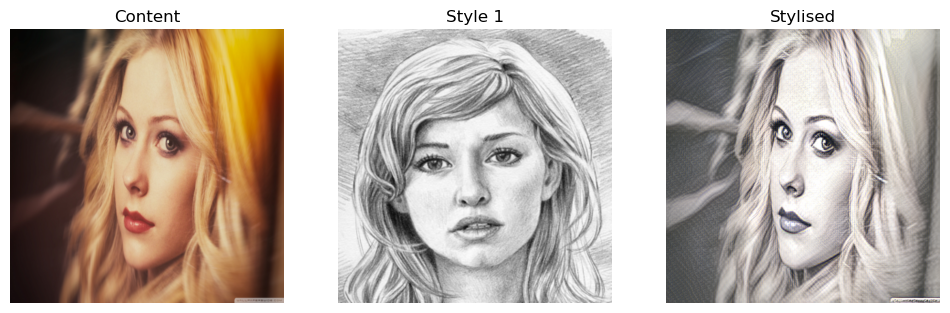

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.581, 150.98195800965186)

In [15]:
vgg3_3Model = AdaIN(prebuildEncoder, "./vgg19_3_3_default_5.pth")
vgg3_3Model.uploadDecoder(vgg19_3_3Decoder())
vgg3_3Model.setup(27)
vgg3_3Model.fit(image_path,[style_path])
vgg3_3Model.pipeline()
vgg3_3Model.displayImages()
vgg3_3Model.evaluate()

In [16]:
#Parameter to Train
style_w= [5.0, 10.0, 30.0]
content_w= [1.0, 5.0, 10.0]

#Training complete
# for cw in content_w:
#     for sw in style_w:
#         print(f"Training at content: {cw} and style: {sw}")
#         model = AdaIN(prebuildEncoder)
#         model.loadPrebuildEncoder(27)
#         model.uploadDecoder(vgg19_3_3Decoder())
#         model.epochTraining(train_content_loader, train_style_loader, f"vgg19_3_3_{int(cw)}_{int(sw)}", steps = 20000, epoch = 5, style_weight = sw, content_weight=cw)
#         model.fit(image_path,[style_path])
#         model.pipeline()
#         model.displayImages()

content: 1.0 and style: 5.0


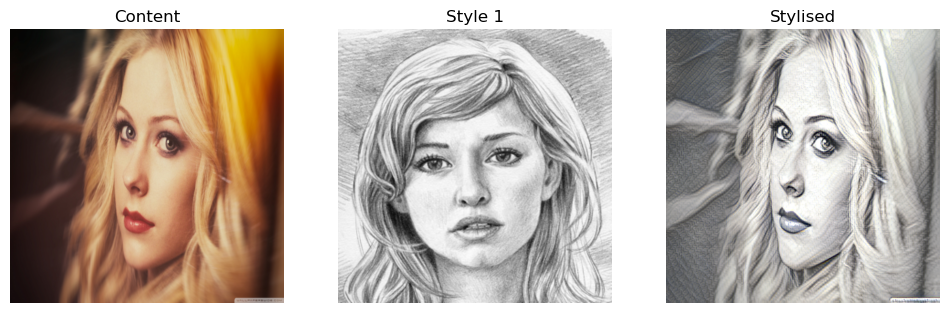

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.64, 137.21537501260173)
content: 1.0 and style: 10.0


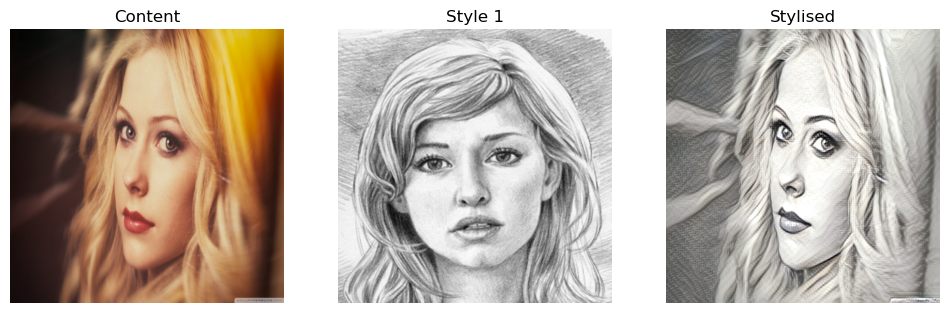

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.633, 119.22504199901596)
content: 1.0 and style: 30.0


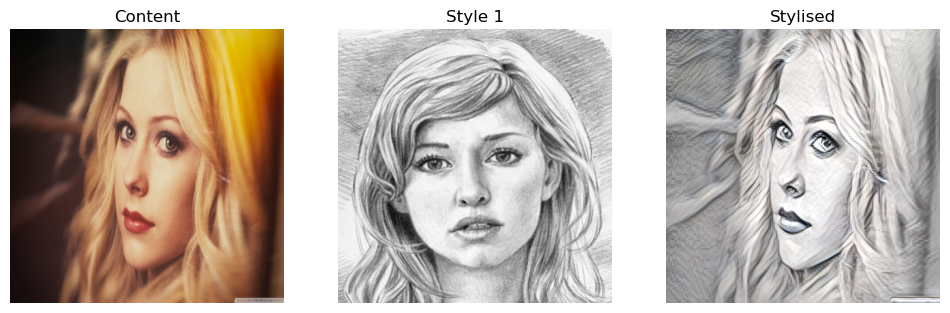

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.693, 124.56162499438506)
content: 5.0 and style: 5.0


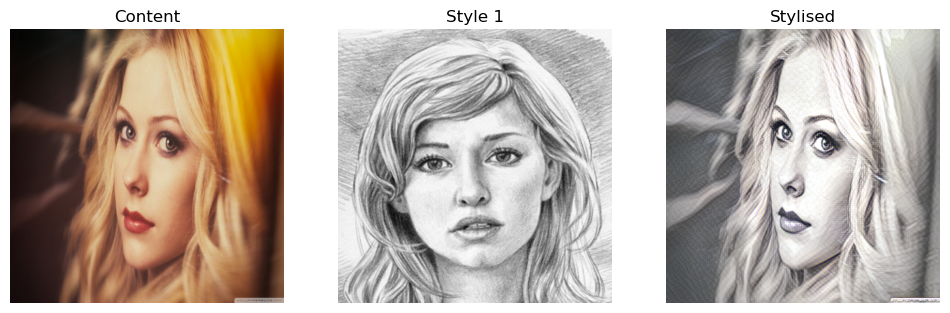

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.591, 125.52766699809581)
content: 5.0 and style: 10.0


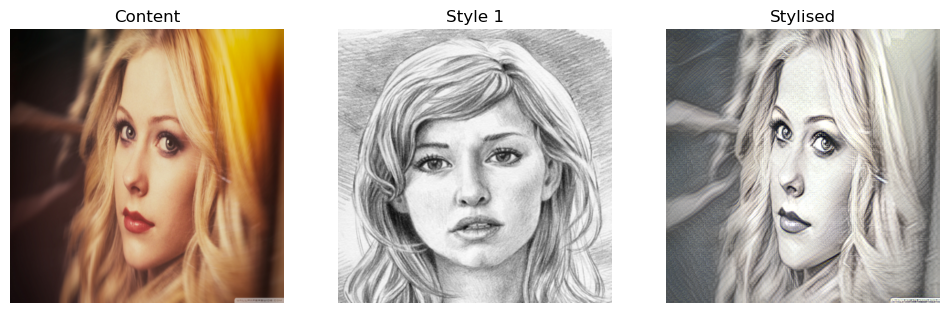

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.614, 124.71025000559166)
content: 5.0 and style: 30.0


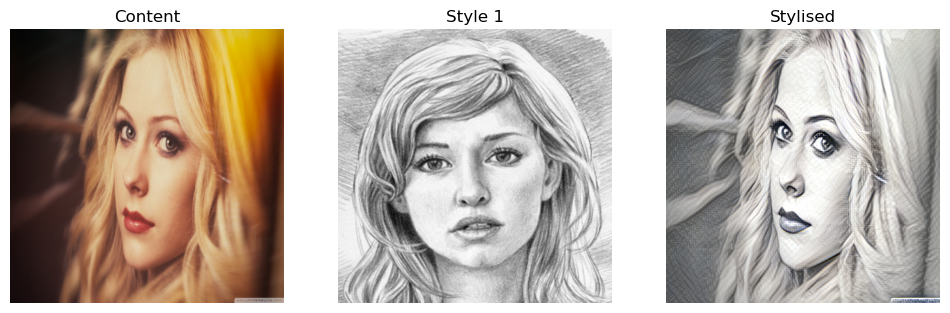

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.654, 126.50500000745524)
content: 10.0 and style: 5.0


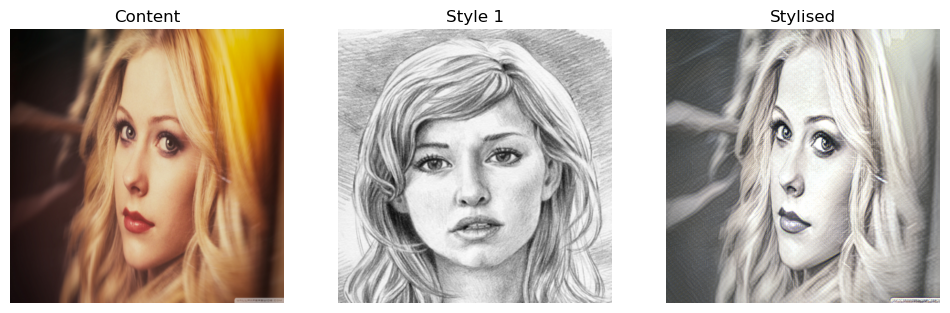

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.57, 126.94324999756645)
content: 10.0 and style: 10.0


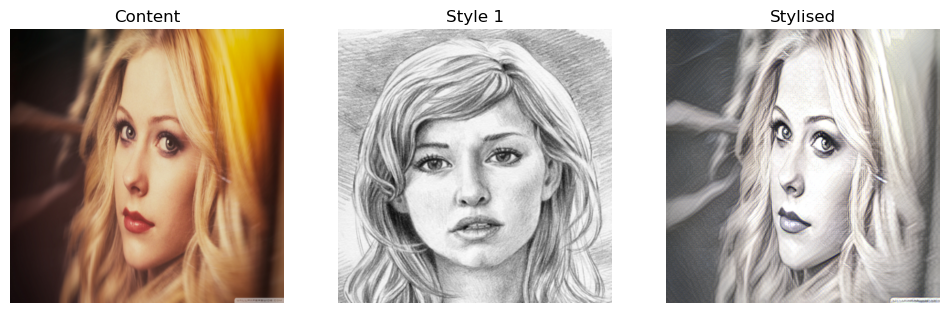

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.551, 124.30591598968022)
content: 10.0 and style: 30.0


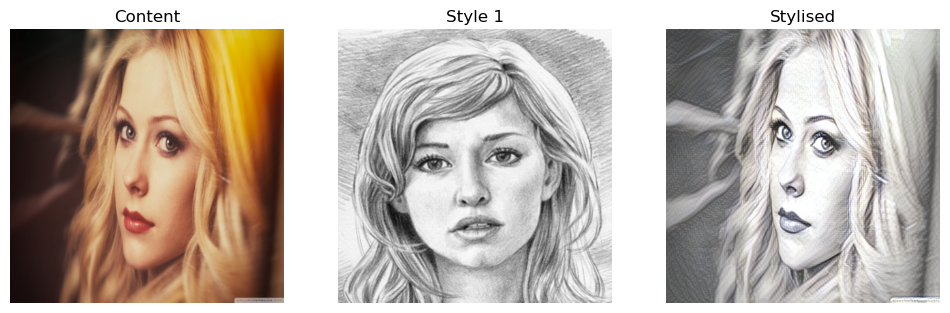

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.618, 119.855541997822)


In [24]:
for cw in content_w:
    for sw in style_w:
        print(f"content: {cw} and style: {sw}")
        model = AdaIN(prebuildEncoder, f"vgg19_3_3_{int(cw)}_{int(sw)}_5.pth")
        model.uploadDecoder(vgg19_3_3Decoder())
        model.setup(27)
        model.fit(image_path,[style_path])
        model.pipeline()
        model.displayImages()
        print(model.evaluate())

In [26]:
# modelLowLR = AdaIN(prebuildEncoder)
# modelLowLR.loadPrebuildEncoder(31)
# modelLowLR.epochTraining(train_content_loader, train_style_loader, f"default_low_LR", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0, learn_rate = 1e-5,)
# modelLowLR.fit(image_path,[style_path])
# modelLowLR.pipeline()
# modelLowLR.displayImages()

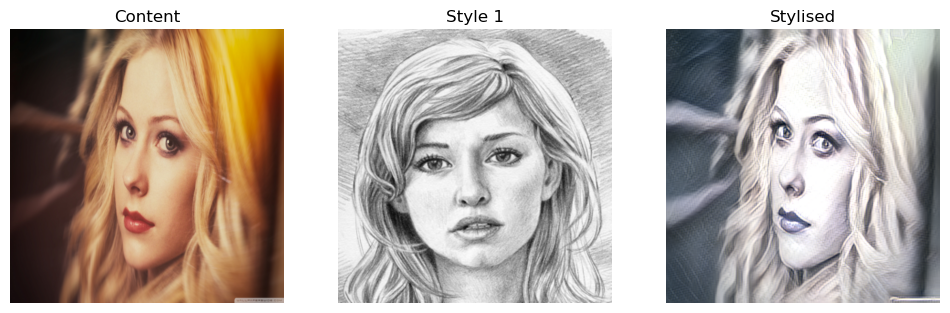

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.631, 133.92016700527165)

In [30]:
modelLowLR = AdaIN(prebuildEncoder,"default_low_LR_5.pth")
modelLowLR.setup(31)
modelLowLR.fit(image_path,[style_path])
modelLowLR.pipeline()
modelLowLR.displayImages()
modelLowLR.evaluate()

In [ ]:
#Training complete
# modelHighLR = AdaIN(prebuildEncoder)
# modelHighLR.loadPrebuildEncoder(31)
# modelHighLR.epochTraining(train_content_loader, train_style_loader, f"default_high_LR", steps = 20000, epoch = 5, style_weight = 1.0, content_weight=1.0, learn_rate = 1e-3,)
# modelHighLR.fit(image_path,[style_path])
# modelHighLR.pipeline()
# modelHighLR.displayImages()

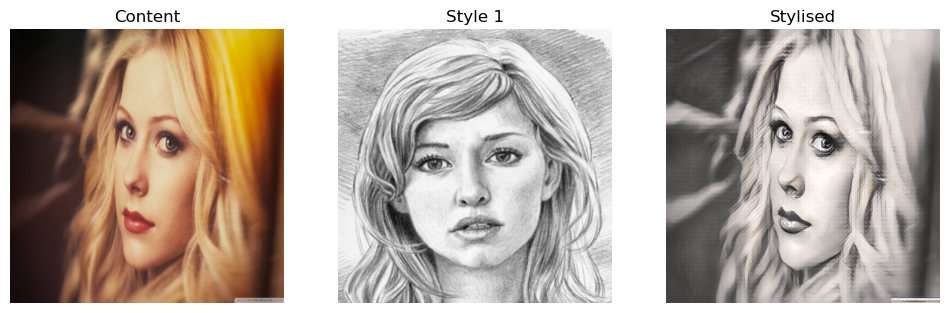

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


(0.588, 151.04674999020062)

In [32]:
modelHighLR = AdaIN(prebuildEncoder, "default_high_LR_5.pth")
modelHighLR.setup(31)
modelHighLR.fit(image_path,[style_path])
modelHighLR.pipeline()
modelHighLR.displayImages()
modelHighLR.evaluate()

Training at content: 1.0 and style: 40.0
Epoch: 1
[1000/20000] content=2.2044 style=29.7444 total=31.948790
[2000/20000] content=2.0703 style=16.0511 total=18.121420
[3000/20000] content=1.9989 style=13.5208 total=15.519647
[4000/20000] content=1.9067 style=11.4319 total=13.338582
[5000/20000] content=1.9717 style=11.1969 total=13.168569
[6000/20000] content=1.7670 style=8.8036 total=10.570559
[7000/20000] content=1.8253 style=8.5236 total=10.348903
[8000/20000] content=1.7989 style=7.9899 total=9.788836
[9000/20000] content=1.7796 style=8.0948 total=9.874493
[10000/20000] content=1.7510 style=7.4157 total=9.166727
[11000/20000] content=1.7321 style=6.8139 total=8.545982
[12000/20000] content=1.7622 style=7.5915 total=9.353667
[13000/20000] content=1.7527 style=7.0524 total=8.805057
[14000/20000] content=1.7113 style=6.5185 total=8.229772
[15000/20000] content=1.7551 style=6.8959 total=8.651039
[16000/20000] content=1.7453 style=7.1837 total=8.929023
[17000/20000] content=1.6439 style=

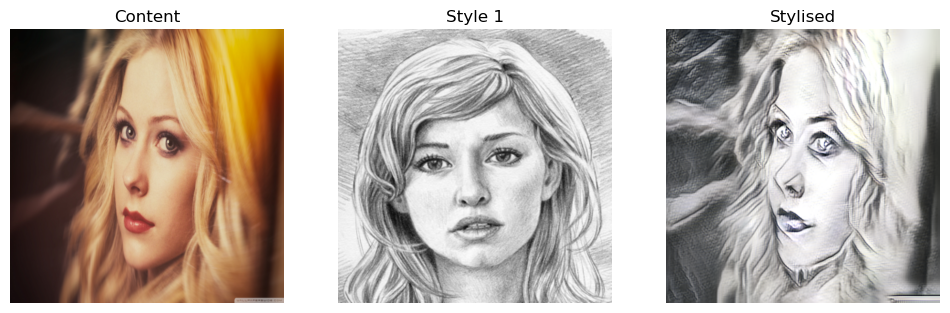

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.706, 151.59479100839235)
Training at content: 1.0 and style: 50.0
Epoch: 1
[1000/20000] content=2.1978 style=35.6479 total=37.845688
[2000/20000] content=2.0902 style=20.8842 total=22.974394
[3000/20000] content=2.0248 style=16.6601 total=18.684902
[4000/20000] content=1.9681 style=14.7643 total=16.732391
[5000/20000] content=1.9654 style=13.3534 total=15.318759
[6000/20000] content=1.8691 style=11.8311 total=13.700218
[7000/20000] content=1.8800 style=10.9176 total=12.797548
[8000/20000] content=1.8788 style=11.5468 total=13.425605
[9000/20000] content=1.8592 style=9.7870 total=11.646188
[10000/20000] content=1.8748 style=10.3239 total=12.198679
[11000/20000] content=1.7874 style=9.0808 total=10.868196
[12000/20000] content=1.8039 style=8.7493 total=10.553176
[13000/20000] content=1.7345 style=8.1122 total=9.846657
[1400

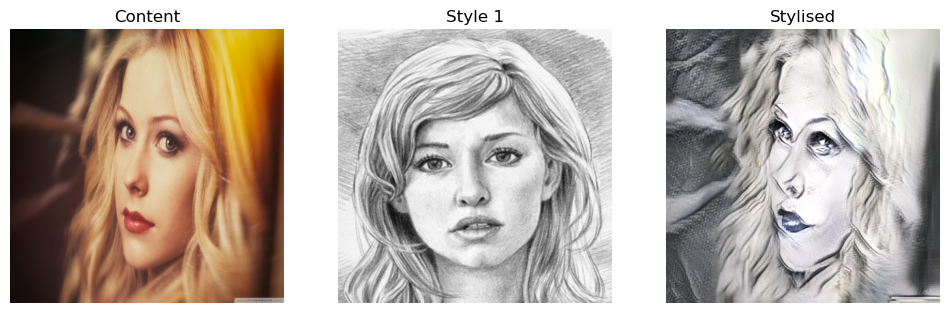

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.742, 3478.3979159983573)
Training at content: 2.0 and style: 40.0
Epoch: 1
[1000/20000] content=4.5439 style=29.6574 total=34.201309
[2000/20000] content=4.1143 style=16.0288 total=20.143105
[3000/20000] content=3.8503 style=12.4687 total=16.319016
[4000/20000] content=3.7661 style=11.4430 total=15.209059
[5000/20000] content=3.5815 style=10.1124 total=13.693917
[6000/20000] content=3.4585 style=9.1097 total=12.568133
[7000/20000] content=3.4557 style=8.6911 total=12.146797
[8000/20000] content=3.3452 style=8.0469 total=11.392109
[9000/20000] content=3.2229 style=7.3047 total=10.527596
[10000/20000] content=3.3142 style=7.9662 total=11.280440
[11000/20000] content=3.1243 style=6.8900 total=10.014337
[12000/20000] content=3.1879 style=6.9479 total=10.135843
[13000/20000] content=3.1069 style=6.5897 total=9.696552
[14000/20

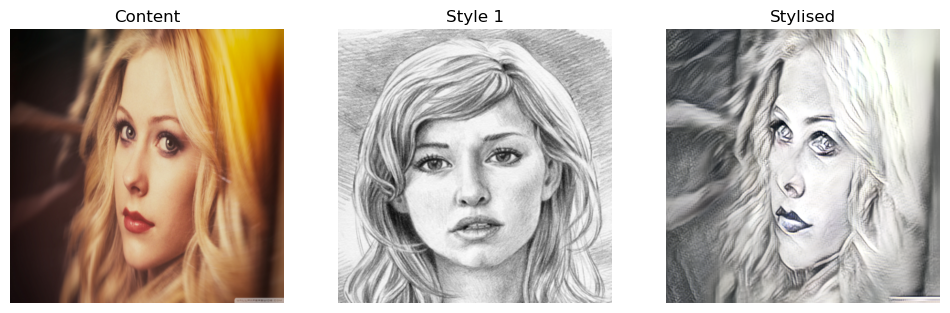

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.703, 3253.880083997501)
Training at content: 2.0 and style: 50.0
Epoch: 1
[1000/20000] content=4.3848 style=36.1496 total=40.534397
[2000/20000] content=4.0581 style=19.4310 total=23.489035
[3000/20000] content=3.8888 style=16.3831 total=20.271978
[4000/20000] content=3.6069 style=13.4434 total=17.050354
[5000/20000] content=3.7526 style=13.2325 total=16.985096
[6000/20000] content=3.4842 style=11.1687 total=14.652928
[7000/20000] content=3.2964 style=10.1191 total=13.415455
[8000/20000] content=3.4924 style=11.4325 total=14.924856
[9000/20000] content=3.3490 style=9.8894 total=13.238439
[10000/20000] content=3.3374 style=9.1542 total=12.491568
[11000/20000] content=3.2211 style=8.8892 total=12.110275
[12000/20000] content=3.2058 style=8.3348 total=11.540641
[13000/20000] content=3.2892 style=9.2574 total=12.546531
[14000

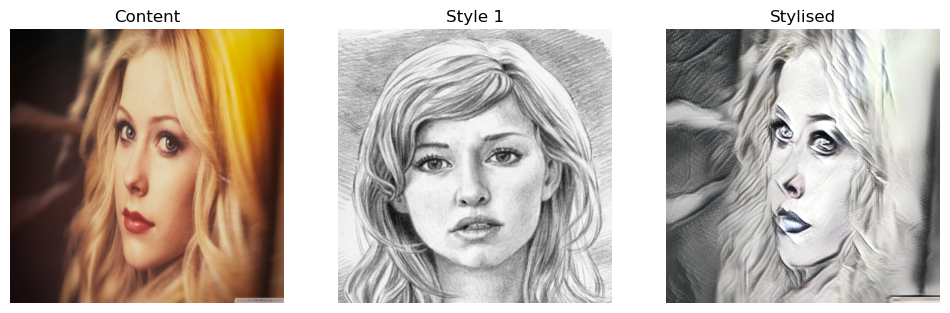

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.692, 3335.389624990057)
Training at content: 3.0 and style: 40.0
Epoch: 1
[1000/20000] content=6.6016 style=27.0899 total=33.691525
[2000/20000] content=6.0550 style=16.2580 total=22.312941
[3000/20000] content=5.5177 style=12.2529 total=17.770554
[4000/20000] content=5.4010 style=11.9262 total=17.327209
[5000/20000] content=5.2055 style=10.2624 total=15.467874
[6000/20000] content=5.0620 style=9.4648 total=14.526855
[7000/20000] content=5.0325 style=8.9603 total=13.992757
[8000/20000] content=4.7946 style=8.2784 total=13.072988
[9000/20000] content=4.5871 style=7.5446 total=12.131672
[10000/20000] content=4.6118 style=7.4472 total=12.058958
[11000/20000] content=4.5560 style=7.3424 total=11.898419
[12000/20000] content=4.3115 style=6.6670 total=10.978429
[13000/20000] content=4.3072 style=6.8847 total=11.191945
[14000/20

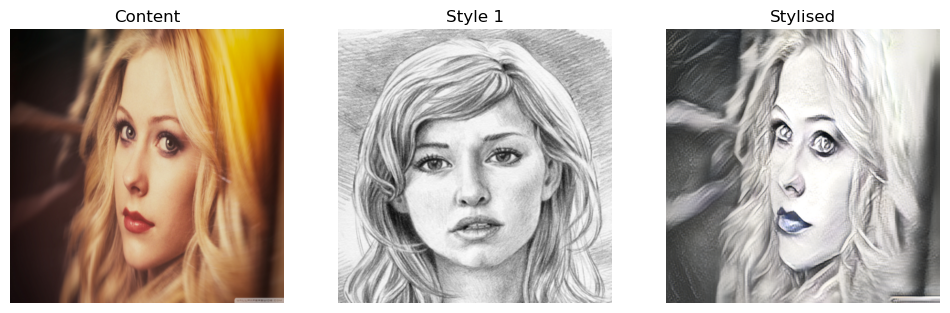

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.663, 2934.4842080026865)
Training at content: 3.0 and style: 50.0
Epoch: 1
[1000/20000] content=6.7141 style=37.3909 total=44.104969
[2000/20000] content=6.2696 style=23.1055 total=29.375105
[3000/20000] content=5.7801 style=17.2722 total=23.052237
[4000/20000] content=5.4442 style=14.4394 total=19.883587
[5000/20000] content=5.3229 style=12.2932 total=17.616079
[6000/20000] content=5.2700 style=12.3796 total=17.649576
[7000/20000] content=5.0913 style=10.6165 total=15.707757
[8000/20000] content=4.8970 style=9.8696 total=14.766678
[9000/20000] content=4.9241 style=10.2067 total=15.130745
[10000/20000] content=4.9542 style=10.3839 total=15.338079
[11000/20000] content=4.8361 style=9.5427 total=14.378798
[12000/20000] content=4.6935 style=8.4652 total=13.158686
[13000/20000] content=4.6408 style=8.5583 total=13.199047
[140

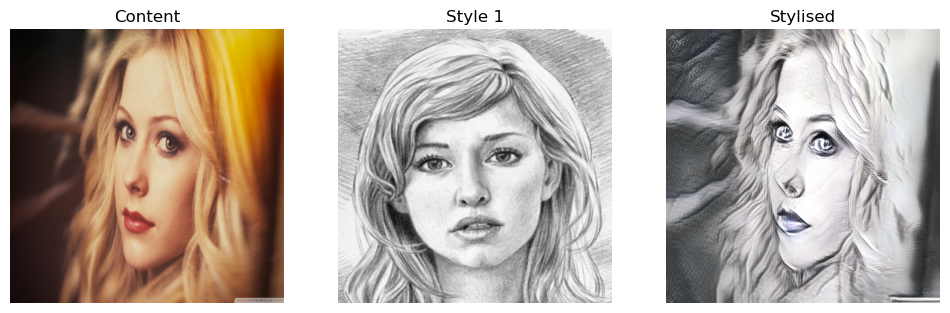

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /opt/anaconda3/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth
(0.693, 4284.129625011701)


In [34]:
#Parameter to Train
style_w= [40.0, 50.0]
content_w= [1.0, 2.0, 3.0]


for cw in content_w:
    for sw in style_w:
        print(f"Training at content: {cw} and style: {sw}")
        model = AdaIN(prebuildEncoder)
        model.loadPrebuildEncoder(31)
        model.epochTraining(train_content_loader, train_style_loader, f"default_{int(cw)}_{int(sw)}", steps = 20000, epoch = 5, style_weight = sw, content_weight=cw)
        model.fit(image_path,[style_path])
        model.pipeline()
        model.displayImages()
        print(model.evaluate())